<a href="https://colab.research.google.com/github/Volks44/ML_Lab_Comp/blob/main/hw__phase2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Jose Burgos (BX7FN1)

# Homework - Phase 1


##Libraries

In [ ]:
!pip install hvplot --q
!pip install hiplot --q
!pip install jupyter_bokeh --q
!pip install ydata-profiling --q
!pip install lime --q
!pip install shap --q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 170.3/170.3 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 863.2/863.2 kB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 36.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 41.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.6/148.6 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 38.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 23.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 32.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 3.5 MB/s eta 0:00:00
     ━━

In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import hvplot.pandas
import hiplot as hip
from ydata_profiling import ProfileReport
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import xgboost as xgb
import lime.lime_tabular
from sklearn.preprocessing import StandardScaler
import shap

## Dataset
### Ames Housing Dataset

 Is a well-known dataset in the field of machine learning and data analysis. It contains various features and attributes of residential homes in Ames, Iowa, USA. The dataset is often used for regression tasks, particularly for predicting housing prices.

In [ ]:
train_file_path = "/content/drive/MyDrive/Colab Notebooks/Trustworthy AI and Data Analysis/train.csv"
dataset_df = pd.read_csv(train_file_path)
dataset_df = dataset_df.drop('Id', axis=1)
dataset_df.head(5)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


The dataset contains 29 numeric variables, 30 categorical variables, and 1 boolean variable, most of which could be insignificant for the price prediction model, therefore a feature selection process can be run to obtain the most significant features for training.

### Data Cleaning

In [ ]:
for column in dataset_df.columns:
    if dataset_df[column].dtype == 'object':
        dataset_df[column] = dataset_df[column].fillna(dataset_df[column].mode()[0])
    else:
        dataset_df[column] = dataset_df[column].fillna(dataset_df[column].median())

### Data Visualization

In [ ]:
dataset_df.hvplot.explorer()

hvDataFrameExplorer(advanced=Advanced(explorer=..., name='Advanced01522', opts={}), axes=Axes(explorer=..., height=None, legend='bottom_right', logx=False, logy=False, name='Axes01516', responsive=True, shared_axes=True, width=None, xlim=None, ylim=None), by=[], code="df.hvplot(\n    kind='scatter',\n    x='index',\n    legend='bottom_right',\n    widget_location='bottom',\n)", colormapping=Colormapping(clim=None, cmap='kbc_r', cnorm='linear', color=None, colorbar=None, explorer=..., name='Colormapping01517', rescale_discrete_levels=True, symmetric=False), geographic=Geographic(crs=None, crs_kwargs={}, explorer=..., feature_scale='110m', features=None, geo=False, global_extent=None, name='Geographic01519', project=False, projection=None, projection_kwargs={}, tiles=None), groupby=[], kind='scatter', labels=Labels(clabel='', explorer=..., fontscale=1, name='Labels01518', rot=0, title='', xlabel='', ylabel=''), name='hvDataFrameExplorer01494', operations=Operations(aggregator=None, datashade=False, dynspread=False, explorer=..., name='Operations01520', rasterize=False, x_sampling=None, y_sampling=None), statusbar=StatusBar(live_update=True, name='StatusBar01509'), style=Style(alpha=1, explorer=..., name='Style01521'), x='index', y='MSSubClass', y_multi=[], z=None)

## Feature Selection




In [ ]:
dataset_df_encoded = pd.get_dummies(dataset_df, drop_first=True)

### Top 10 Features

In [ ]:
X = dataset_df_encoded.drop(columns=['SalePrice'])
y = dataset_df_encoded['SalePrice']

model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X, y)

feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': model.feature_importances_
}).sort_values(by='Importance', ascending=False)

print(feature_importance[:10])

                  Feature    Importance
3             OverallQual  5.806850e-01
15              GrLivArea  1.112906e-01
11            TotalBsmtSF  3.920556e-02
8              BsmtFinSF1  3.069653e-02
13               2ndFlrSF  3.006885e-02
..                    ...           ...
228      MiscFeature_Othr  2.974264e-08
120    Exterior1st_CBlock  2.700727e-08
55   Neighborhood_Blueste  1.614089e-08
109        RoofStyle_Shed  3.641451e-09
89        Condition2_PosA  0.000000e+00

[244 rows x 2 columns]


In [ ]:
print(feature_importance[:10])

        Feature  Importance
3   OverallQual    0.580685
15    GrLivArea    0.111291
11  TotalBsmtSF    0.039206
8    BsmtFinSF1    0.030697
13     2ndFlrSF    0.030069
25   GarageCars    0.024534
12     1stFlrSF    0.023593
26   GarageArea    0.013440
2       LotArea    0.012373
5     YearBuilt    0.009026


### Recursive Feature Elimination

In [ ]:
estimator = RandomForestRegressor(n_estimators=100, random_state=42)
selector = RFE(estimator, n_features_to_select=10)
selector = selector.fit(X, y)

selected_features = X.columns[selector.support_]
print("Selected features:", list(selected_features))

Selected features: ['LotArea', 'OverallQual', 'YearBuilt', 'BsmtFinSF1', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageCars', 'GarageArea']


Two Feature selections procces were conducted and the features selected are listed next:
* SalePrice - the property's sale price in dollars. (**target variable**)
* LotArea: Lot size in square feet
* OverallQual: Overall material and finish quality
* YearBuilt: Original construction date
* BsmtFinSF1: Type 1 finished square feet
* TotalBsmtSF: Total square feet of basement area
* 1stFlrSF: First Floor square feet
* 2ndFlrSF: Second floor square feet
* GrLivArea: Above grade (ground) living area square feet
* GarageCars: Size of garage in car capacity
* GarageArea: Size of garage in square feet

## Profiling

With the features selected we can start with the profiling to highlight the most significant features

In [ ]:
selected_features_prof = list(selected_features)
selected_features_prof.append('SalePrice')
df = dataset_df[selected_features_prof]
profile_2 = ProfileReport(df, title="Report")
profile_2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 11/11 [00:00<00:00, 50.01it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The correlation heatmap effectively visualizes the relationships among your selected features, notably highlighting that SalePrice is strongly positively correlated with GrLivArea, OverallQual, GarageCars, GarageArea, 1stFlrSF, and TotalBsmtSF. Additionally, it reveals significant multicollinearity among related features like GarageCars and GarageArea as was expected because it's part of the same feature, and various area features as 1stFlrSF, TotalBsmtSF and GrLivArea.

The analysis for 2ndFlrSF shows that a significant portion (56.8%) have a value of zero, meaning over half the homes have no second floor. The accompanying histogram confirms this, showing a large spike at zero and a distribution towards lower positive values. The "High correlation" suggests it's an important feature, despite many zero values.

# Homework - Phase 2

## Data split

In [ ]:
train = dataset_df[selected_features]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(train, y, test_size=0.2, random_state=42)

## CNN

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
X_train_cnn = X_train_scaled.reshape(-1, X_train_scaled.shape[1], 1)
X_test_cnn = X_test_scaled.reshape(-1, X_test_scaled.shape[1], 1)

In [ ]:
def model(input_dim):
    model = Sequential([
        Input(shape=(input_dim, 1)),
        Conv1D(64, kernel_size=3, activation='relu', padding='same'),
        MaxPooling1D(2),
        Dropout(0.2),
        Conv1D(128, kernel_size=3, activation='relu', padding='same'),
        MaxPooling1D(2),
        Dropout(0.2),
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(64, activation='relu'),
        Dense(1)
    ])

    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='mse',
                  metrics=['mae'])

    return model

df_dim = train.shape[1]

cnn_model = model(df_dim)

cnn_model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_10 (Conv1D)              │ (None, 10, 64)         │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_10 (MaxPooling1D) │ (None, 5, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 5, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_11 (Conv1D)              │ (None, 5, 128)         │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_11 (MaxPooling1D) │ (None, 2, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 2, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 66,177 (258.50 KB)

 Trainable params: 66,177 (258.50 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
cnn_model.fit(X_train_cnn, y_train, epochs=100, batch_size=32, verbose=0, validation_split=0.1)

## XGBoost

In [ ]:
xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

## Models Evaluation

In [ ]:
def evaluate_model(y_true, y_pred, name="Model"):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    print(f"{name} - MAE: {mae:.2f}, RMSE: {rmse:.2f}, R²: {r2:.4f}")

In [ ]:
y_pred_cnn = cnn_model.predict(X_test_cnn).flatten()

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


In [ ]:
y_pred_xgb = xgb_model.predict(X_test)

### CNN


In [ ]:
evaluate_model(y_test, y_pred_cnn, "CNN")

CNN - MAE: 24195.95, RMSE: 39385.41, R²: 0.7978


The CNN model’s R² of 0.80 shows the model explains 80% of the variability in prices, meaning it captures most patterns well but could improve slightly.










### XGBoost

In [ ]:
evaluate_model(y_test, y_pred_xgb, "XGBoost")

XGBoost - MAE: 19081.92, RMSE: 30240.48, R²: 0.8808


The XGBoost model has an R² of 0.88, it explains 88% of the variation in house prices, demonstrating a strong fit and better performance than the CNN.

### Comparison

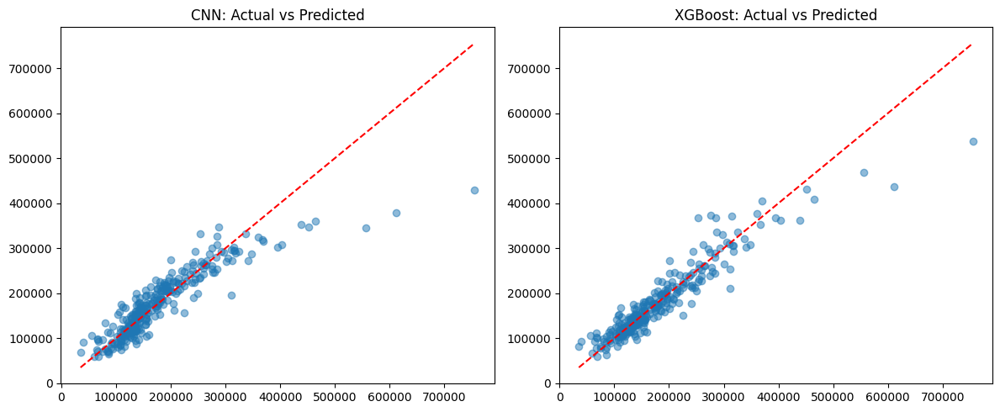

In [ ]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.scatter(y_test, y_pred_cnn, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title("CNN: Actual vs Predicted")

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred_xgb, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title("XGBoost: Actual vs Predicted")

plt.tight_layout()
plt.show()


the XGBoost model appears to be performing better than the CNN model. The predictions from XGBoost are more tightly clustered around the ideal line, suggesting lower prediction errors (RMSE and MAE) and potentially a higher R-squared score as was shown before. It also seems to handle the full range of house prices, including the higher end, with greater consistency.

## LIME for CNN

In [ ]:
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=selected_features,
    mode='regression'
)

def cnn_predict_fn(data_2d):
    data_3d = data_2d.reshape(-1, data_2d.shape[1], 1)
    preds = cnn_model.predict(data_3d)
    return preds.flatten()

i = 10
exp = explainer_lime.explain_instance(
    data_row=X_test_scaled[i],
    predict_fn=cnn_predict_fn,
    num_features=10
)

exp.show_in_notebook(show_table=True)

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


For this specific valure ($83,562.25) using LIME we can see that a predicted low price is primarily driven by its older age (YearBuilt), smaller living areas (1st/2nd floor SF, total basement SF, overall living area), and smaller garage features. These negative factors heavily outweighed the single positive influence of its above-average overall quality. The model seems to interpret this as an older, smaller house with good quality, but the size and age are stronger price depressors.

## SHAP for XGBoost

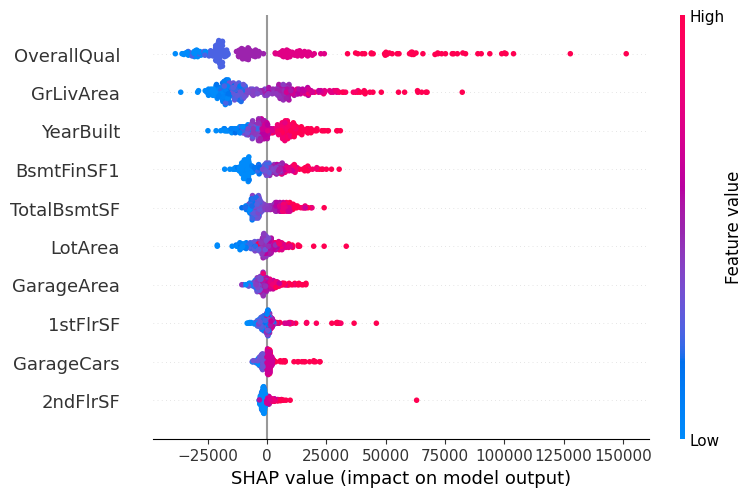

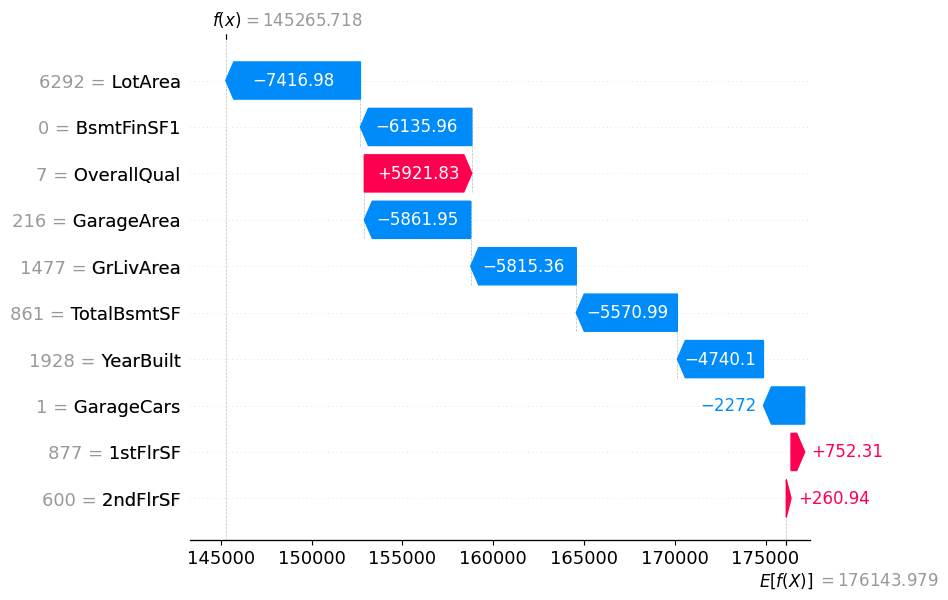

In [ ]:
explainer_shap = shap.Explainer(xgb_model, X_train)

shap_values = explainer_shap(X_test)

shap.plots.beeswarm(shap_values)

shap.plots.waterfall(shap_values[i])

For this particular house, the model predicted a price of \$145,265.718, which is lower than the average (\$176,144). This lower prediction is due to: a relatively small lot area, no finished basement, a small garage area, and smaller overall living areas, as well as being a very old house. The only significant positive influence on its price comes from its OverallQual being 7, along with minor positive boosts from its 1stFlrSF and 2ndFlrSF. In essence, the house's age and overall smaller dimensions are pulling its price down despite its good quality for its size.